## 1. Load the required libraries

In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV
import optuna

## 2. Loading the data


In [6]:
df=pd.read_csv("Data_power.csv")

## 3.Data Preprocessing

In [8]:
df.sample(5)

,S no,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Air Quality Index (PM),Cloudiness,Power Consumption in A Zone
38665,38666,23.53,61.29,4.927,728.000,41.090,153.0,0,33489.55752
41899,41900,18.05,92.3,0.068,0.088,0.093,156.0,0,31925.77681
47958,47959,12.55,75.6,0.071,0.059,0.145,156.0,0,24147.69231
33200,33201,27.79,66.59,4.927,824.000,77.600,154.0,0,40888.96781
27776,27777,25.9,78.3,4.909,0.077,0.126,150.0,0,48644.25249


In [9]:
df.shape

(52583, 9)

#### This dataset is having 52583 rows and 9 columns.

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52583 entries, 0 to 52582
Data columns (total 9 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   S no                          52583 non-null  int64  
 1   Temperature                   52263 non-null  object 
 2   Humidity                      52558 non-null  object 
 3   Wind Speed                    52512 non-null  object 
 4   general diffuse flows         52275 non-null  float64
 5   diffuse flows                 52568 non-null  float64
 6   Air Quality Index (PM)        52565 non-null  float64
 7   Cloudiness                    52583 non-null  int64  
 8    Power Consumption in A Zone  52583 non-null  float64
dtypes: float64(4), int64(2), object(3)
memory usage: 3.6+ MB


In [12]:
df.isnull().sum()/len(df)*100

S no                            0.000000
Temperature                     0.608562
Humidity                        0.047544
Wind Speed                      0.135025
general diffuse flows           0.585741
diffuse flows                   0.028526
Air Quality Index (PM)          0.034232
Cloudiness                      0.000000
 Power Consumption in A Zone    0.000000
dtype: float64

#### 6 columns are having missing values -(Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Air Quality Index (PM))

#### We can drop the first column "S no" as it is of no use

In [15]:
df.drop(columns=["S no"],inplace=True,axis=1)

In [16]:
df.shape

(52583, 8)

In [17]:
for i in df.columns:
    print(df[i].value_counts())

Temperature
20.76    56
19.79    55
15.18    55
20.74    52
15.85    51
         ..
35.14     1
34.31     1
33.49     1
33.35     1
6.58      1
Name: count, Length: 3438, dtype: int64
Humidity
85.9     200
85       190
84.6     189
86.3     188
86.6     187
        ... 
31.41      1
16.95      1
17.92      1
18.42      1
45.89      1
Name: count, Length: 4444, dtype: int64
Wind Speed
0.082    2296
0.083    1984
0.084    1839
0.081    1803
0.085    1519
         ... 
0.366       1
0.624       1
0.81        1
0.43        1
3.006       1
Name: count, Length: 549, dtype: int64
general diffuse flows
0.055     1569
0.062     1544
0.051     1497
0.059     1466
0.066     1455
          ... 
51.320       1
46.680       1
46.080       1
42.690       1
5.819        1
Name: count, Length: 10497, dtype: int64
diffuse flows
0.115    1265
0.122    1223
0.119    1205
0.126    1152
0.111    1149
         ... 
0.623       1
2.552       1
4.161       1
6.457       1
2.618       1
Name: count, Length: 104

In [18]:
df.describe()

,general diffuse flows,diffuse flows,Air Quality Index (PM),Cloudiness,Power Consumption in A Zone
count,52275.000000,52568.000000,52565.000000,52583.000000,52583.000000
mean,182.964247,74.872330,154.499191,0.009338,31061.821779
std,264.571351,124.084858,2.871553,0.096180,8021.057455
min,0.004000,0.011000,150.000000,0.000000,9457.750760
25%,0.062000,0.122000,152.000000,0.000000,24738.858990
50%,5.226000,4.412000,155.000000,0.000000,31189.787230
75%,320.100000,100.500000,157.000000,0.000000,36721.582445
max,1163.000000,936.000000,159.000000,1.000000,52204.395120


In [19]:
df_filtered = df[df['Temperature'].astype(str).str.contains(r'[a-zA-Z]')]

In [20]:
df_filtered

,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Air Quality Index (PM),Cloudiness,Power Consumption in A Zone
87,NaN,54.06,0.075,449.2,41.52,152.0,1,18036.47416
88,NaN,55.56,0.075,437.4,44.13,151.0,1,17996.35258
89,NaN,56.69,0.077,422.0,43.87,159.0,1,17952.58359
90,NaN,57.26,0.077,409.0,44.90,157.0,1,17894.22492
91,NaN,57.96,0.074,391.8,46.89,153.0,1,17846.80851
...,...,...,...,...,...,...,...,...
52578,NaN,75.6,0.094,436.2,38.96,157.0,0,34444.55696
52579,NaN,73.5,0.089,451.6,37.73,157.0,0,34438.48101
52580,NaN,70.1,0.085,466.4,37.49,157.0,0,33873.41772
52581,NaN,67.75,0.086,477.0,37.37,152.0,0,33988.86076


In [21]:
df["Temperature"]=np.where(df["Temperature"]=='5.488 dc',5.488,df["Temperature"])
df["Temperature"]=np.where(df["Temperature"]=='13.65 CD',13.65,df["Temperature"])
df["Temperature"]=np.where(df["Temperature"]=='12.31 dc',12.31 ,df["Temperature"])

In [22]:
df[df["Humidity"]=='84.8 i']

,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Air Quality Index (PM),Cloudiness,Power Consumption in A Zone
719,9.11,84.8 i,0.088,0.033,0.156,155.0,0,19575.68389


In [23]:
df["Humidity"]=np.where(df["Humidity"]=='84.8 i',84.8,df["Humidity"])

In [24]:
df[df["Wind Speed"]=='8.50%']

,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Air Quality Index (PM),Cloudiness,Power Consumption in A Zone
41,4.29,77,8.50%,0.033,0.193,158.0,1,12908.20669
139,12.07,70.7,8.50%,0.033,0.078,151.0,1,20768.38906
144,11.01,75.8,8.50%,0.033,0.163,156.0,1,18047.41641
174,10.03,83.8,8.50%,0.029,0.163,153.0,1,13517.32523


In [25]:
df["Wind Speed"]=np.where(df["Wind Speed"]=='8.50%',8.50,df["Wind Speed"])

In [26]:
df=df.astype({"Temperature":"float64","Humidity":"float64","Wind Speed":"float64"})

In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52583 entries, 0 to 52582
Data columns (total 8 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Temperature                   52263 non-null  float64
 1   Humidity                      52558 non-null  float64
 2   Wind Speed                    52512 non-null  float64
 3   general diffuse flows         52275 non-null  float64
 4   diffuse flows                 52568 non-null  float64
 5   Air Quality Index (PM)        52565 non-null  float64
 6   Cloudiness                    52583 non-null  int64  
 7    Power Consumption in A Zone  52583 non-null  float64
dtypes: float64(7), int64(1)
memory usage: 3.2 MB


In [28]:
df.describe()

,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Air Quality Index (PM),Cloudiness,Power Consumption in A Zone
count,52263.000000,52558.00000,52512.000000,52275.000000,52568.000000,52565.000000,52583.000000,52583.000000
mean,18.827384,68.28577,1.955961,182.964247,74.872330,154.499191,0.009338,31061.821779
std,5.813293,15.54517,2.348552,264.571351,124.084858,2.871553,0.096180,8021.057455
min,3.247000,11.34000,0.050000,0.004000,0.011000,150.000000,0.000000,9457.750760
25%,14.430000,58.33000,0.078000,0.062000,0.122000,152.000000,0.000000,24738.858990
50%,18.820000,69.88500,0.086000,5.226000,4.412000,155.000000,0.000000,31189.787230
75%,22.910000,81.40000,4.915000,320.100000,100.500000,157.000000,0.000000,36721.582445
max,40.010000,94.80000,8.500000,1163.000000,936.000000,159.000000,1.000000,52204.395120


#### Checking the distribution of the columns before filling missing values

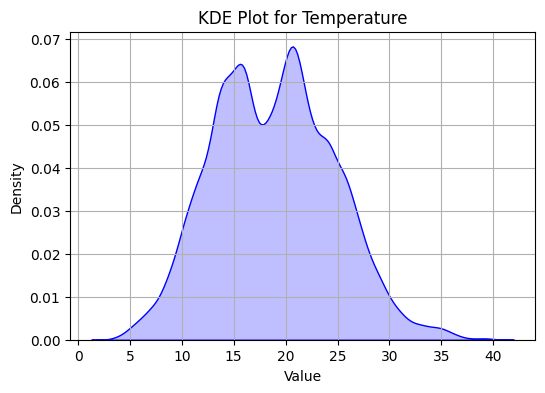

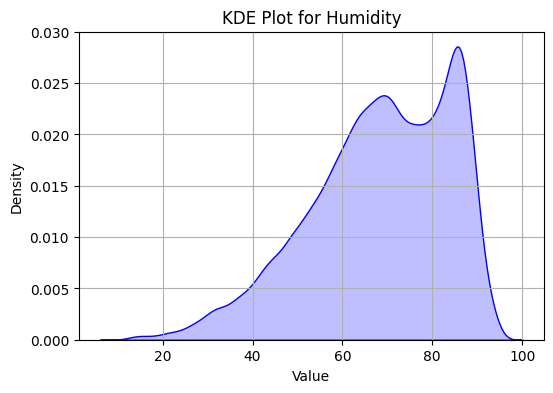

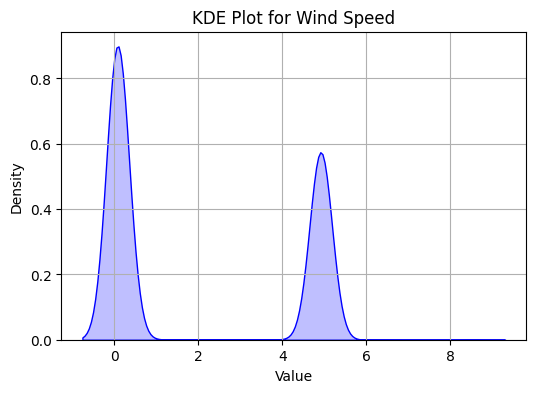

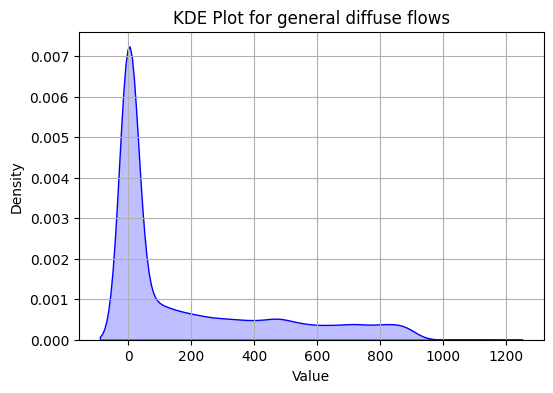

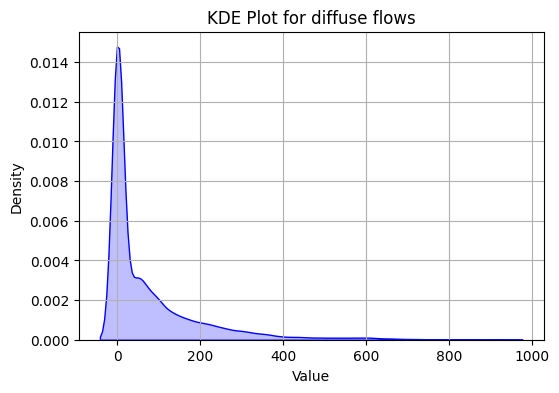

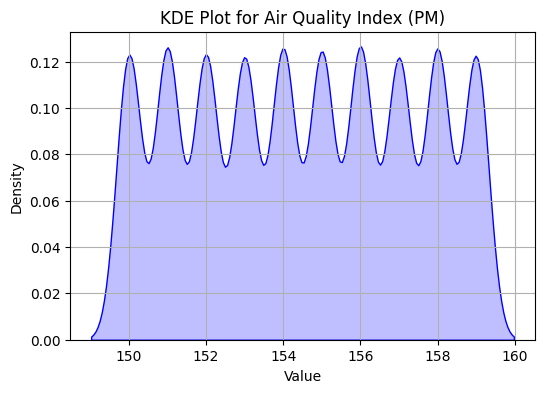

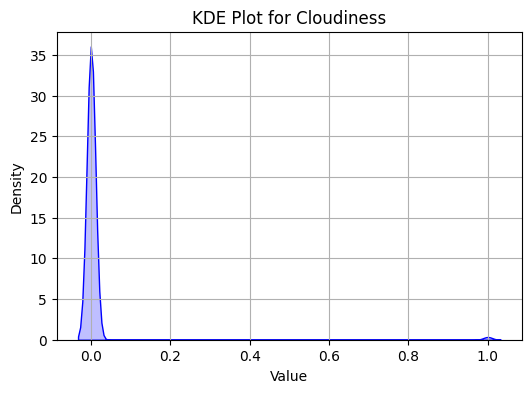

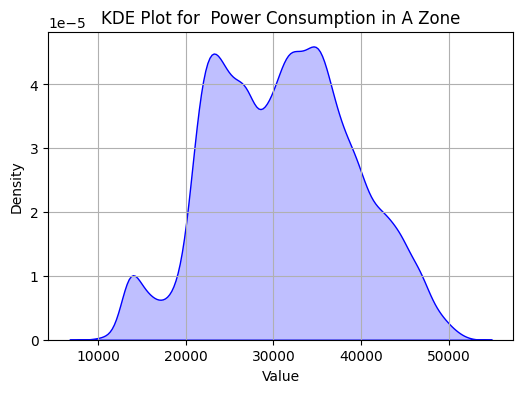

In [30]:
numeric_cols = df.select_dtypes(include=['number']).columns

# Plot KDE for each numeric column
for col in numeric_cols:
    plt.figure(figsize=(6, 4))  # Adjust figure size
    sns.kdeplot(df[col], fill=True, color='blue')
    plt.title(f'KDE Plot for {col}')
    plt.xlabel('Value')
    plt.ylabel('Density')
    plt.grid(True)
    plt.show()

#### Filling the missing values

In [32]:
df["Temperature"].fillna(df["Temperature"].median(),inplace=True)
df["Humidity"].fillna(df["Humidity"].median(),inplace=True)
df["Wind Speed"].fillna(df["Wind Speed"].median(),inplace=True)
df["general diffuse flows"].fillna(df["general diffuse flows"].median(),inplace=True)
df["diffuse flows"].fillna(df["diffuse flows"].median(),inplace=True)
df["Air Quality Index (PM)"].fillna(df["Air Quality Index (PM)"].median(),inplace=True)

In [33]:
df.isnull().sum()

Temperature                     0
Humidity                        0
Wind Speed                      0
general diffuse flows           0
diffuse flows                   0
Air Quality Index (PM)          0
Cloudiness                      0
 Power Consumption in A Zone    0
dtype: int64

#### Treating the outliers

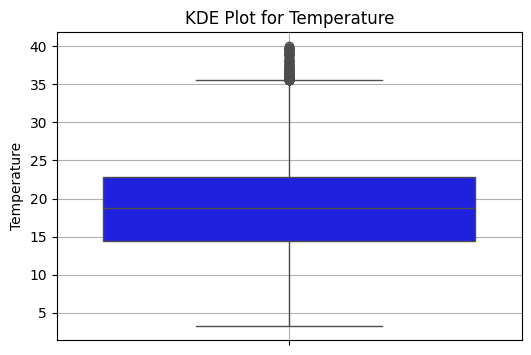

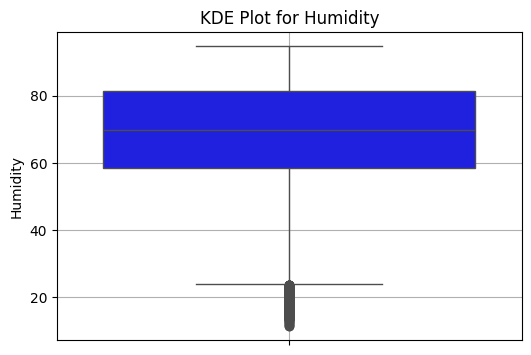

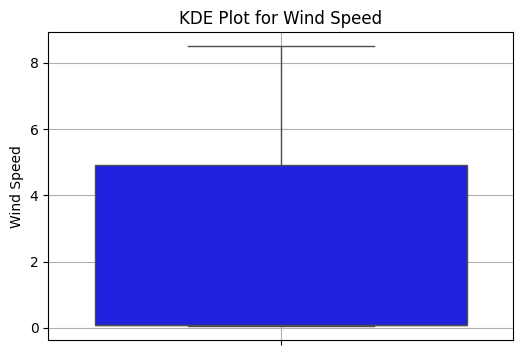

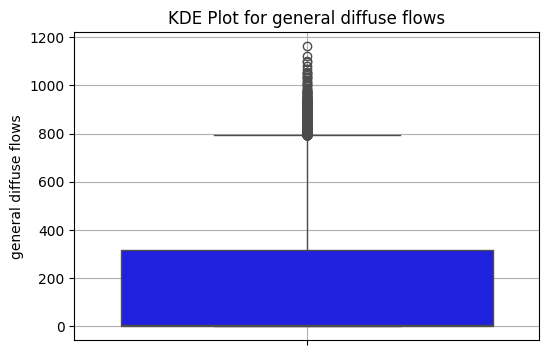

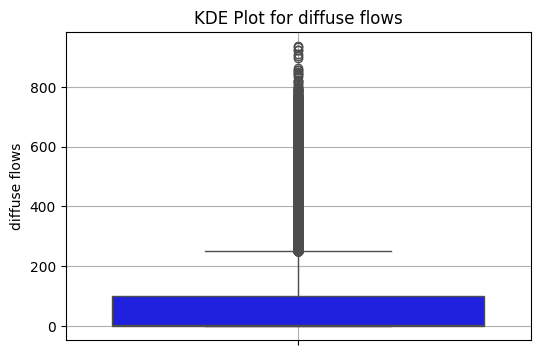

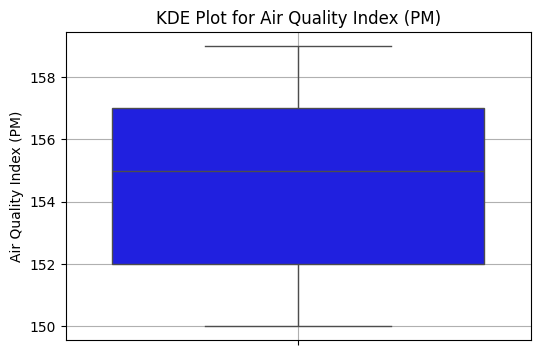

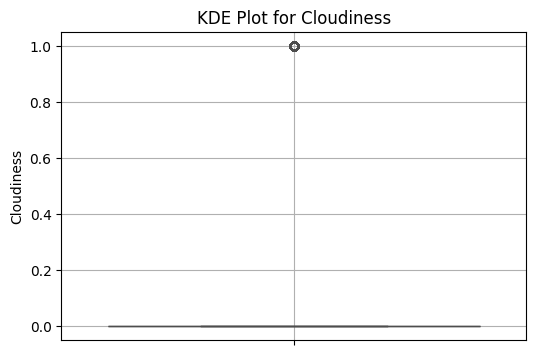

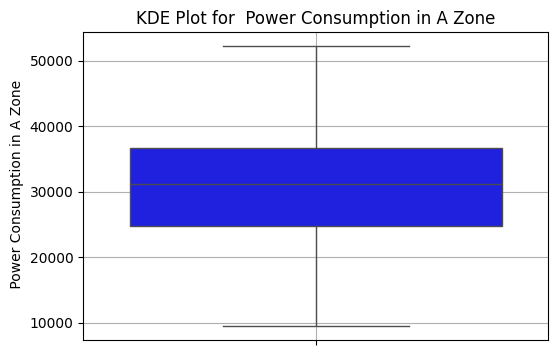

In [35]:
numeric_cols = df.select_dtypes(include=['number']).columns

# Plotting boxplot for each numeric column
for col in numeric_cols:
    plt.figure(figsize=(6, 4))  # Adjust figure size
    sns.boxplot(df[col], fill=True, color='blue')
    plt.title(f'KDE Plot for {col}')
   
    plt.ylabel(col)
    plt.grid(True)
    plt.show()

#### As we can see columns like Temperature,Humidity,General Diffuse flows,Diffuse flows are having the outliers.

In [37]:
columns=["Temperature","Humidity","general diffuse flows","diffuse flows"] 

In [38]:
def outliers(columns,df):
    for col in columns:
     q3=np.percentile(df[col],75)
     q1=np.percentile(df[col],25)
     iqr=q3-q1
     ll=q1-1.5*iqr
     ul=q3+1.5*iqr
     df[col]=np.clip(df[col],ll,ul)

In [39]:
outliers(columns,df)

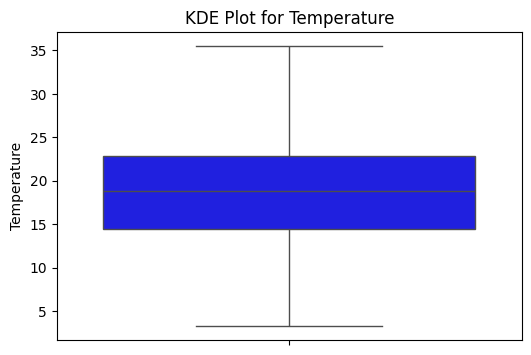

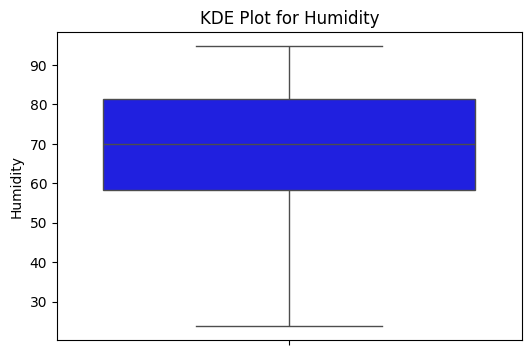

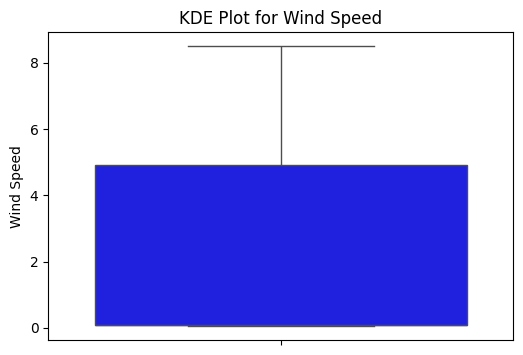

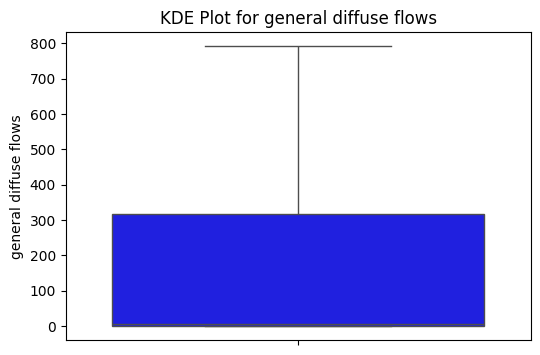

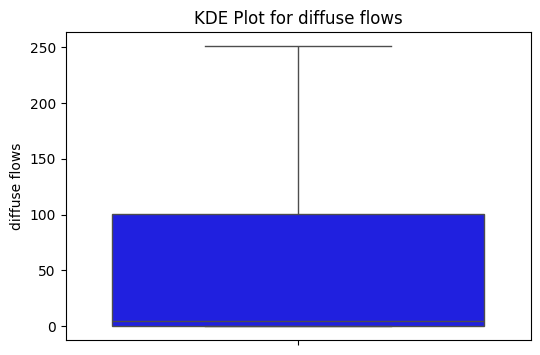

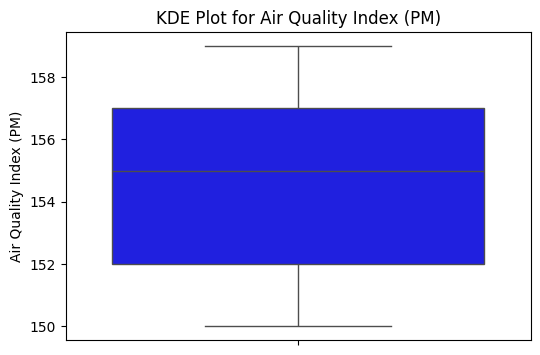

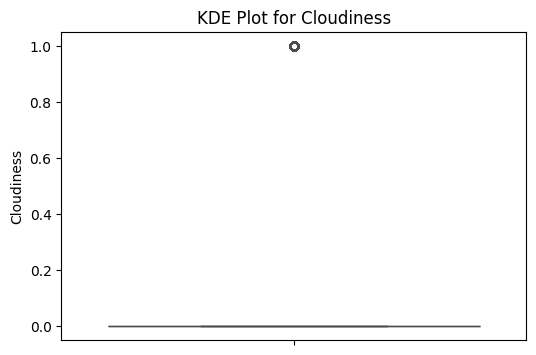

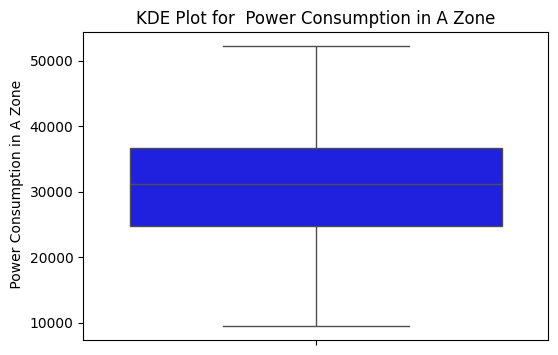

In [40]:
numeric_cols = df.select_dtypes(include=['number']).columns

# Plotting boxplot for each numeric column
for col in numeric_cols:
    plt.figure(figsize=(6, 4))  # Adjust figure size
    sns.boxplot(df[col], fill=True, color='blue')
    plt.title(f'KDE Plot for {col}')
   
    plt.ylabel(col)
    plt.show()

#### Checking the distribution for the columns after removing outliers

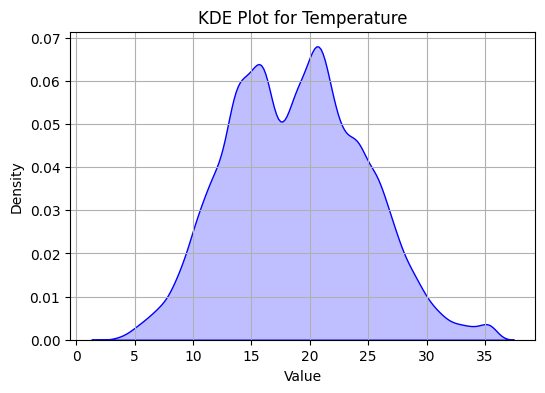

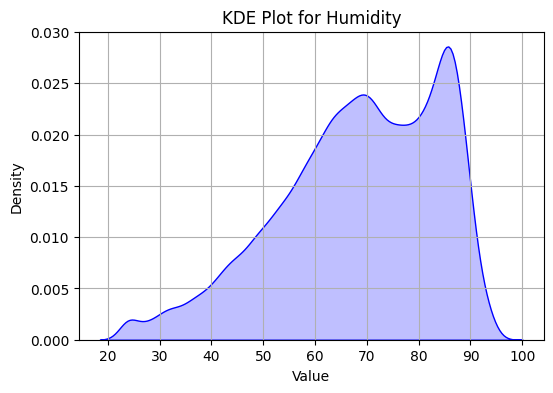

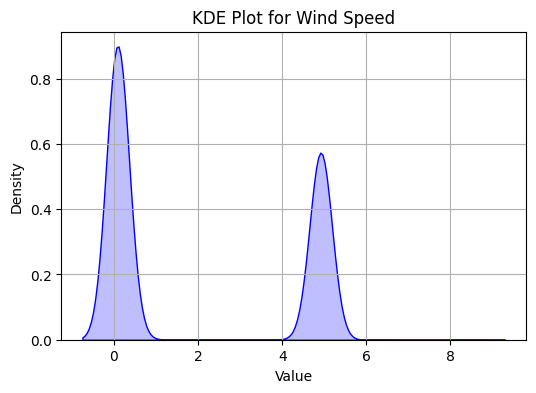

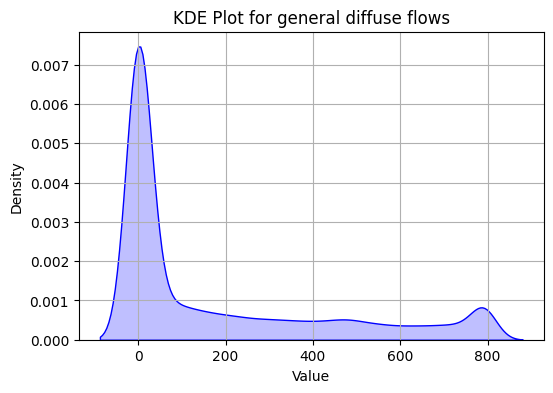

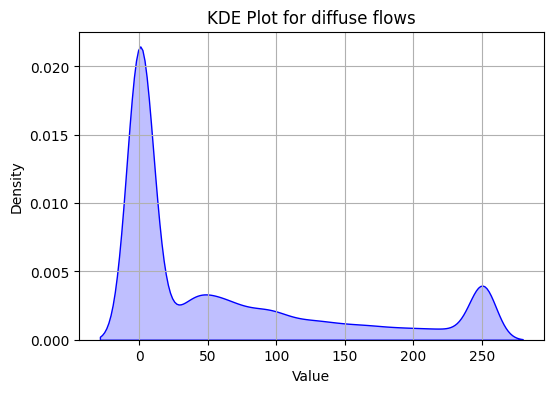

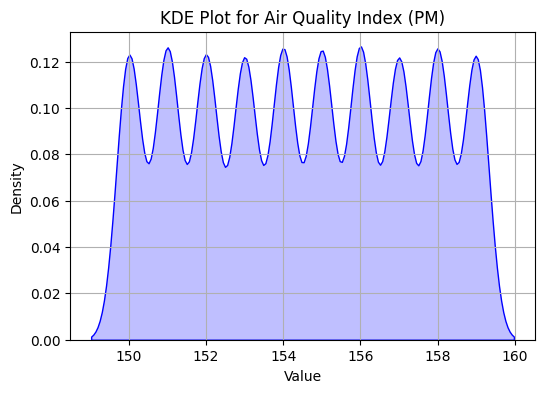

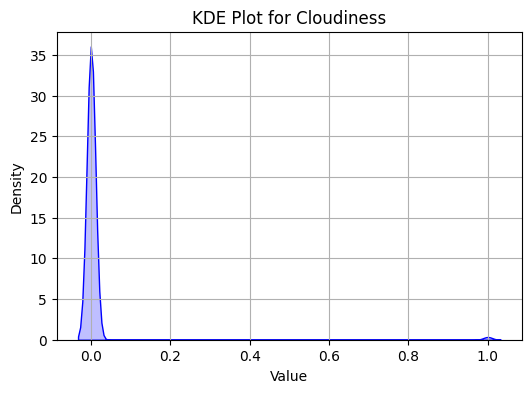

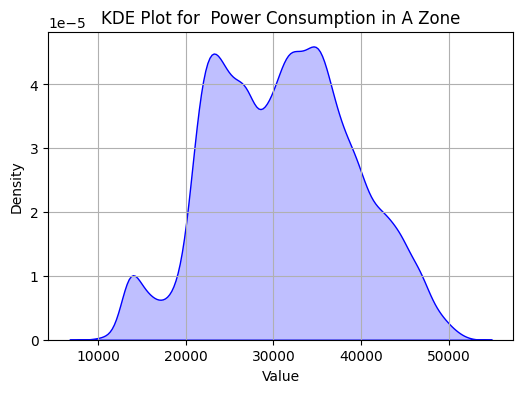

In [42]:
numeric_cols = df.select_dtypes(include=['number']).columns

# Plot KDE for each numeric column
for col in numeric_cols:
    plt.figure(figsize=(6, 4))  # Adjust figure size
    sns.kdeplot(df[col], fill=True, color='blue')
    plt.title(f'KDE Plot for {col}')
    plt.xlabel('Value')
    plt.ylabel('Density')
    plt.grid(True)
    plt.show()

In [43]:
df.describe()

,Temperature,Humidity,Wind Speed,general diffuse flows,diffuse flows,Air Quality Index (PM),Cloudiness,Power Consumption in A Zone
count,52583.000000,52583.000000,52583.000000,52583.000000,52583.000000,52583.000000,52583.000000,52583.000000
mean,18.823179,68.313360,1.953436,179.079258,61.905300,154.499363,0.009338,31061.821779
std,5.782653,15.458215,2.347970,256.982396,84.724407,2.871077,0.096180,8021.057455
min,3.247000,23.750000,0.050000,0.004000,0.011000,150.000000,0.000000,9457.750760
25%,14.450000,58.340000,0.078000,0.062000,0.122000,152.000000,0.000000,24738.858990
50%,18.820000,69.885000,0.086000,5.226000,4.412000,155.000000,0.000000,31189.787230
75%,22.870000,81.400000,4.915000,317.000000,100.450000,157.000000,0.000000,36721.582445
max,35.500000,94.800000,8.500000,792.407000,250.942000,159.000000,1.000000,52204.395120


## 4.Exploratory data analysis

#### a)Univariate analysis

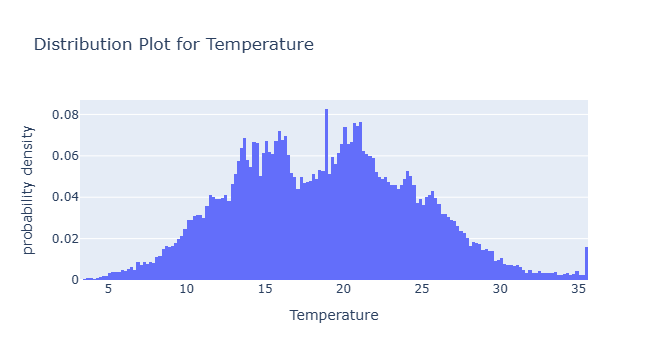

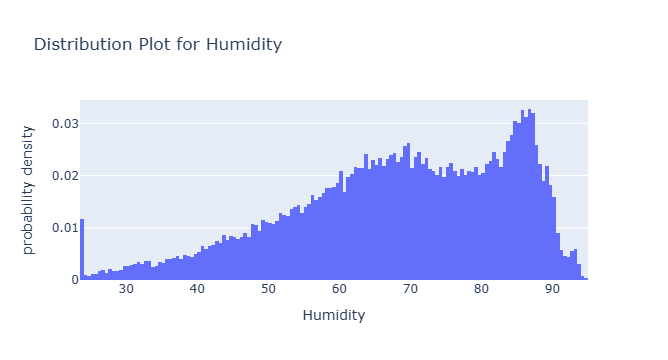

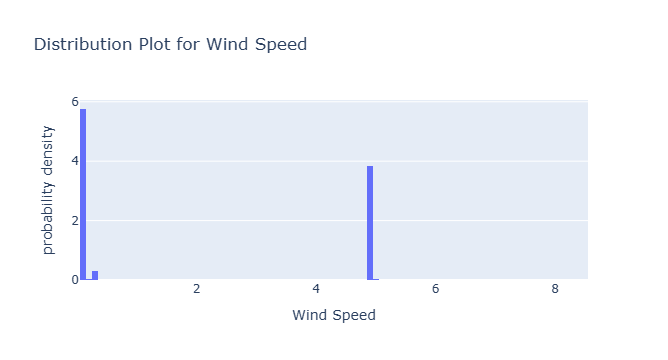

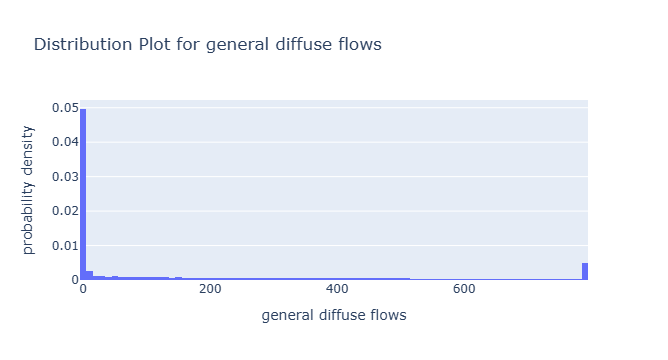

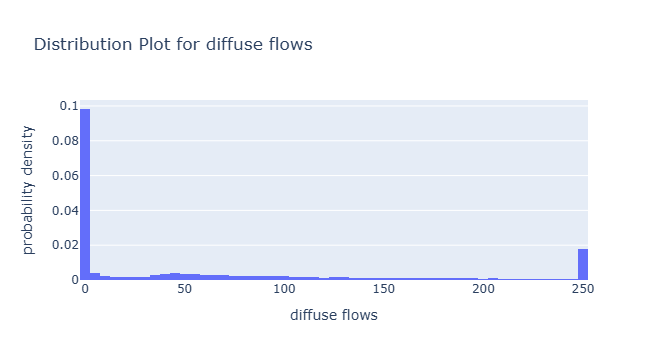

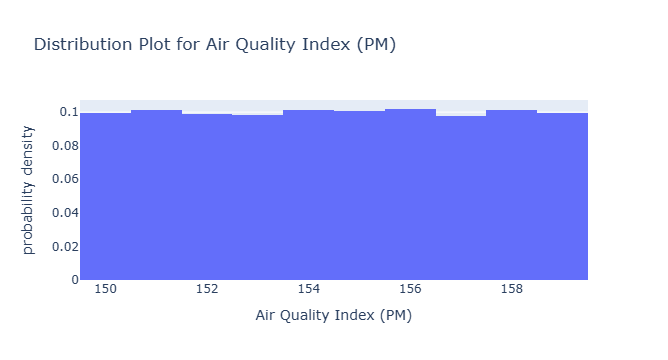

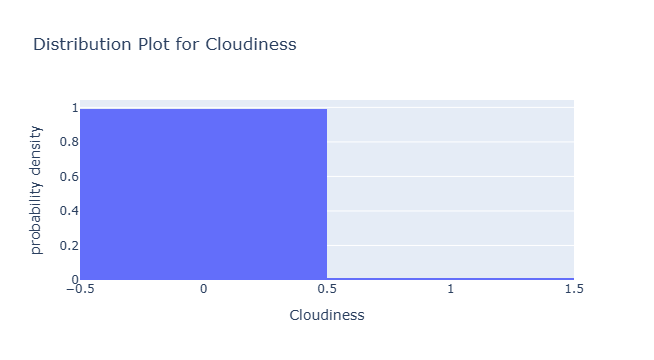

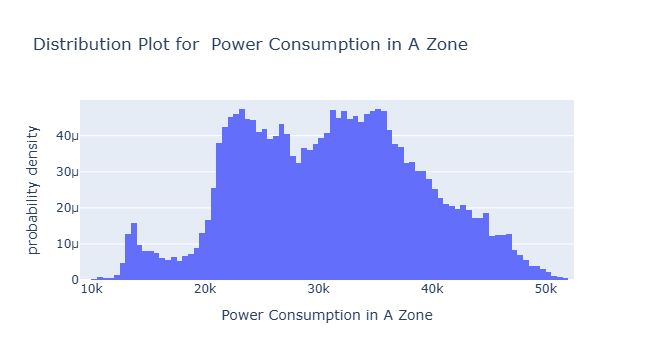

In [46]:
numeric_cols = df.select_dtypes(include=['number']).columns

# Plot distplot for each numeric column
for col in numeric_cols:
    fig = px.histogram(df, x=col, histnorm='probability density',
                       title=f'Distribution Plot for {col}')
    fig.show()

In [47]:
# Potting for categorical column
df["Cloudiness"].value_counts()

Cloudiness
0    52092
1      491
Name: count, dtype: int64

[Text(0, 0, '52092')]

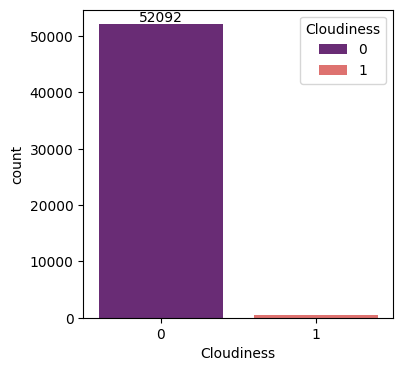

In [48]:
plt.figure(figsize=(4,4))
ax=sns.countplot(x="Cloudiness", data=df,hue="Cloudiness",palette="magma")
ax.bar_label(ax.containers[0]) 

#### b)Bivariate analysis

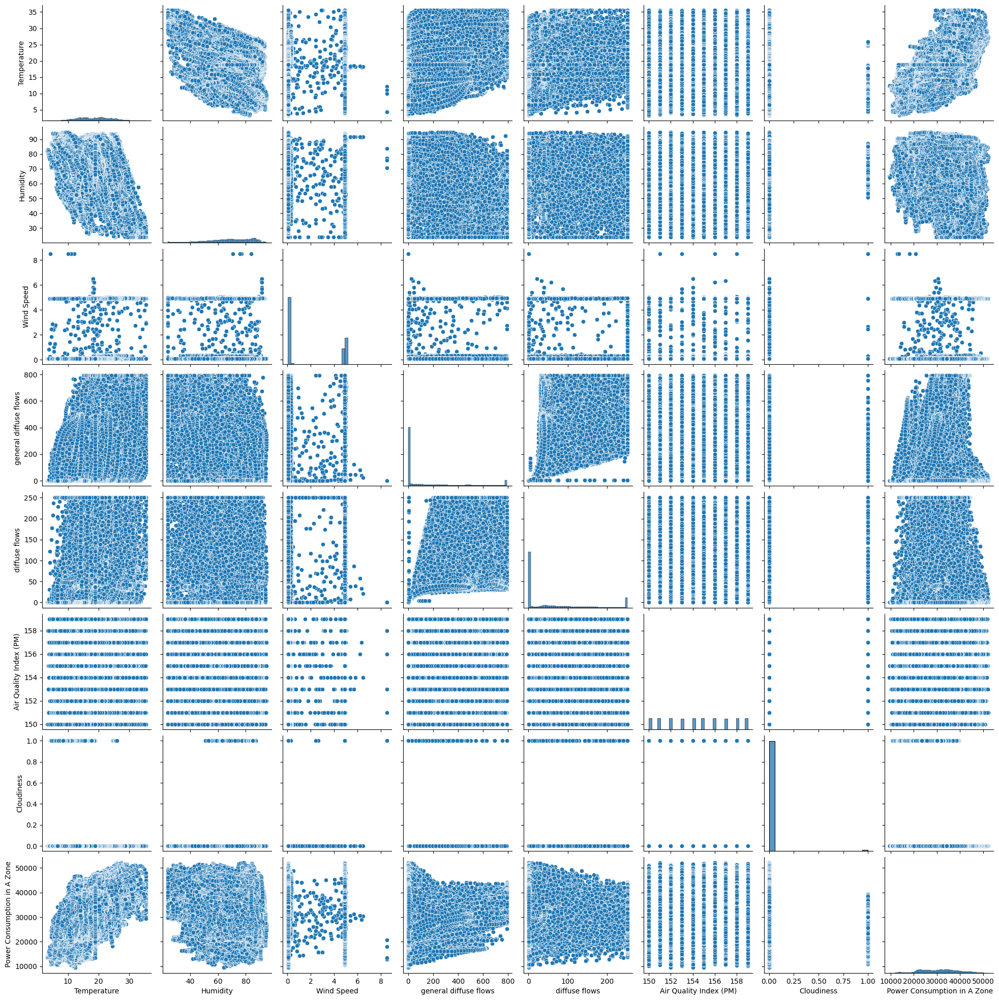

In [50]:
sns.pairplot(df)

<Axes: >

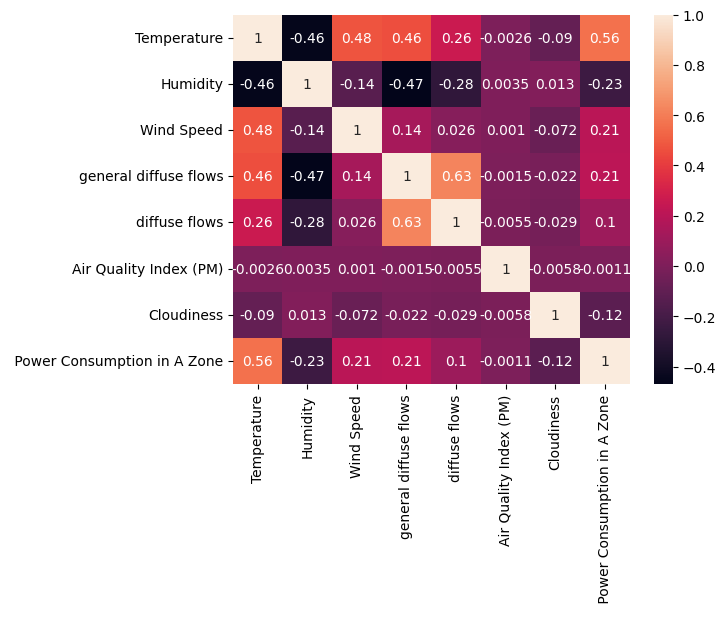

In [51]:
sns.heatmap(df.corr(),annot=True)

#### No two columns are highly correlated

## 5.Model Building

In [54]:
x=df.iloc[:,:-1]
y=df[" Power Consumption in A Zone"]


In [55]:
#Splitting the data
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

In [56]:
#Scaling the input data
scaler=StandardScaler()
x_train_scaled=scaler.fit_transform(x_train)
x_test_scaled=scaler.transform(x_test)

In [57]:
x_train_scaled

array([[ 1.09537251, -0.06966656,  1.26747384, ..., -0.0319264 ,
         1.22244871, -0.09760874],
       [ 0.60132831,  0.09624795, -0.80110269, ...,  0.22313418,
        -0.52154937, -0.09760874],
       [-0.12326986,  0.37707602, -0.79939841, ...,  2.23434409,
         0.17604986, -0.09760874],
       ...,
       [ 0.71920552, -1.17554812,  1.26619563, ..., -0.72906046,
        -0.87034899, -0.09760874],
       [-1.1200257 ,  0.52555983, -0.79471162, ..., -0.728836  ,
         1.22244871, -0.09760874],
       [-0.41449591,  1.05493687, -0.80025055, ..., -0.20393575,
        -0.52154937, -0.09760874]])

In [58]:
x_test_scaled

array([[ 2.13893254, -0.75591998,  1.25980456, ...,  0.17587886,
        -1.56794822, -0.09760874],
       [ 0.70013715,  0.34479693,  1.26278706, ...,  0.0402561 ,
         0.87364909, -0.09760874],
       [ 0.41584504, -0.88503633,  1.26449134, ..., -0.70514927,
         1.57124833, -0.09760874],
       ...,
       [ 1.14564367,  0.54492728,  1.26576956, ...,  0.27984056,
         1.57124833, -0.09760874],
       [-1.58980106,  0.8096158 , -0.79300734, ..., -0.72818624,
         0.52484948, -0.09760874],
       [ 1.58421624, -1.8772955 ,  1.25852634, ...,  0.03541243,
        -0.87034899, -0.09760874]])

In [59]:
models={
    'Linear Regression':LinearRegression(),
     'K Nearest Neighbors':KNeighborsRegressor(),
    'Decision Tree':DecisionTreeRegressor(),
    'Random Forest Regression':RandomForestRegressor(),
      "Support Vector Regressor":SVR(),
     'Xgboost Regression':XGBRegressor()
   }

In [60]:
model_list = []
accuracy_list = []


for model_name, model in models.items():
    
    model.fit(x_train_scaled, y_train)
    y_pred_train = model.predict(x_train_scaled)
    y_pred = model.predict(x_test_scaled)

    # Evaluate the model
    train_accuracy = r2_score(y_train,y_pred_train)
    test_accuracy = r2_score(y_test, y_pred)
    mae=mean_absolute_error(y_test,y_pred)
    mse=mean_squared_error(y_test,y_pred)
  

    print(f"Model: {model_name}")
    print("Training R2 score: ", train_accuracy)
    print("Testing R2 score: ", test_accuracy)
    print("Mean Absolute Error (MAE):", mae)
    print("Mean Squared Error (MSE):", mse)
    
    

    model_list.append(model_name)
    accuracy_list.append(test_accuracy)
    

    print("=" * 35)
    print('\n')

max_accuracy_index = accuracy_list.index(max(accuracy_list))
print(f"The best model based on accuracy is {model_list[max_accuracy_index]} with Testing Accuracy: {accuracy_list[max_accuracy_index]}")

Model: Linear Regression
Training R2 score:  0.32624640110142356
Testing R2 score:  0.33159671223170795
Mean Absolute Error (MAE): 5297.827483547091
Mean Squared Error (MSE): 43178645.3498794


Model: K Nearest Neighbors
Training R2 score:  0.5879388441925303
Testing R2 score:  0.39813381686950255
Mean Absolute Error (MAE): 4623.544753098982
Mean Squared Error (MSE): 38880369.0003485


Model: Decision Tree
Training R2 score:  0.9998845919339645
Testing R2 score:  0.2727697733172735
Mean Absolute Error (MAE): 4162.859632457926
Mean Squared Error (MSE): 46978847.38192854


Model: Random Forest Regression
Training R2 score:  0.9481239639195814
Testing R2 score:  0.6373583539245083
Mean Absolute Error (MAE): 3393.4214553063393
Mean Squared Error (MSE): 23426538.00712341


Model: Support Vector Regressor
Training R2 score:  0.11857522336695858
Testing R2 score:  0.12428963005379501
Mean Absolute Error (MAE): 6024.8100583122
Mean Squared Error (MSE): 56570618.644573055


Model: Xgboost Regre

## Hyperparameter Tuning

In [77]:
rf=RandomForestRegressor(n_estimators= 300,
 min_samples_split= 10,
 min_samples_leaf=6,
 max_depth=20,
 bootstrap= True)
rf.fit(x_train_scaled,y_train)

RandomForestRegressor(max_depth=20, min_samples_leaf=6, min_samples_split=10,
                      n_estimators=300)

In [69]:
model=RandomForestRegressor(random_state=42)


params={ 'n_estimators':[50,100,200,250,300],
        'max_depth':[3,5,7,8,10,11,13,15,18,20],
        'min_samples_split':[2,4,5,6,7,8,9,10],
        'min_samples_leaf':[1,2,3,4,5,6,7,8,9, 10],
       'bootstrap': [True, False]}
random=RandomizedSearchCV(model,param_distributions=params,cv=10,n_jobs=-1)

In [71]:
random.fit(x_train_scaled,y_train)

RandomizedSearchCV(cv=10, estimator=RandomForestRegressor(random_state=42),
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'max_depth': [3, 5, 7, 8, 10, 11, 13,
                                                      15, 18, 20],
                                        'min_samples_leaf': [1, 2, 3, 4, 5, 6,
                                                             7, 8, 9, 10],
                                        'min_samples_split': [2, 4, 5, 6, 7, 8,
                                                              9, 10],
                                        'n_estimators': [50, 100, 200, 250,
                                                         300]})

In [73]:
random.best_params_

{'n_estimators': 300,
 'min_samples_split': 10,
 'min_samples_leaf': 6,
 'max_depth': 20,
 'bootstrap': True}

In [85]:
y_pred_test=random.predict(x_test_scaled)
y_pred_train=random.predict(x_train_scaled)

In [83]:
r2_score(y_test,y_pred_test)

0.6178456415490781

In [87]:
r2_score(y_train,y_pred_train)

0.7863637221334603

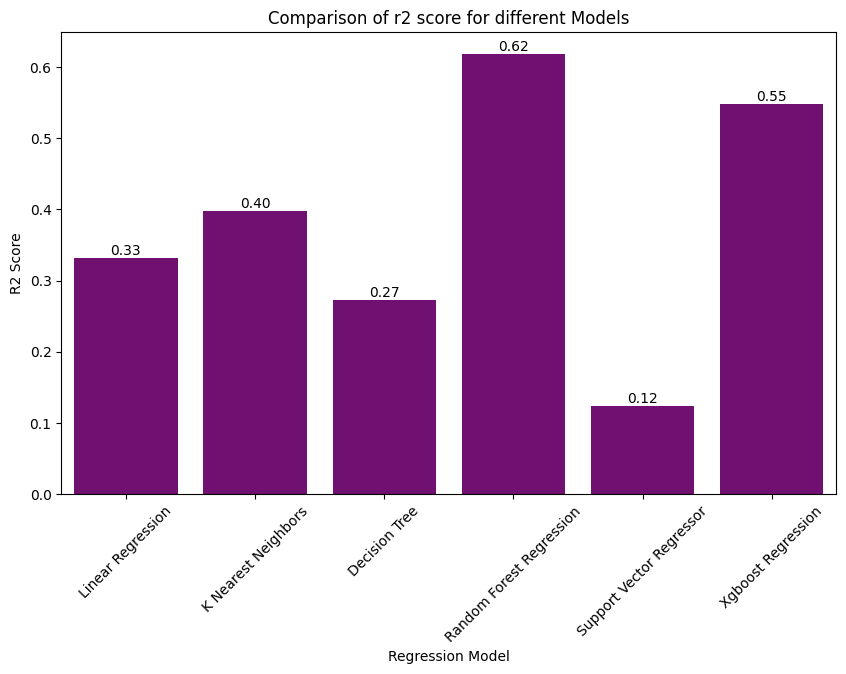

In [92]:
accuracy_list[3]=0.6178456415490781
plt.figure(figsize=(10, 6))
ax=sns.barplot(x=model_list,y=accuracy_list,legend=False,color='purple')
plt.xticks(rotation=45)
ax.bar_label(ax.containers[0], fmt="%.2f")
plt.title("Comparison of r2 score for different Models")
plt.xlabel("Regression Model")
plt.ylabel("R2 Score")
plt.show()

## 6.Feature selection

In [63]:
rf=RandomForestRegressor()
rf.fit(x_train_scaled,y_train)

RandomForestRegressor()

In [96]:
importances=rf.feature_importances_
importances

array([0.53054806, 0.15215167, 0.11050981, 0.10343255, 0.07645254,
       0.0191612 , 0.00774417])

In [98]:
feature_names= pd.DataFrame(x_train).columns

feature_importance = pd.DataFrame({'Feature': feature_names, 'Importance':importances})
feature_importance = feature_importance.sort_values(by='Importance',ascending = False)

Text(0.5, 1.0, 'Feature Importance')

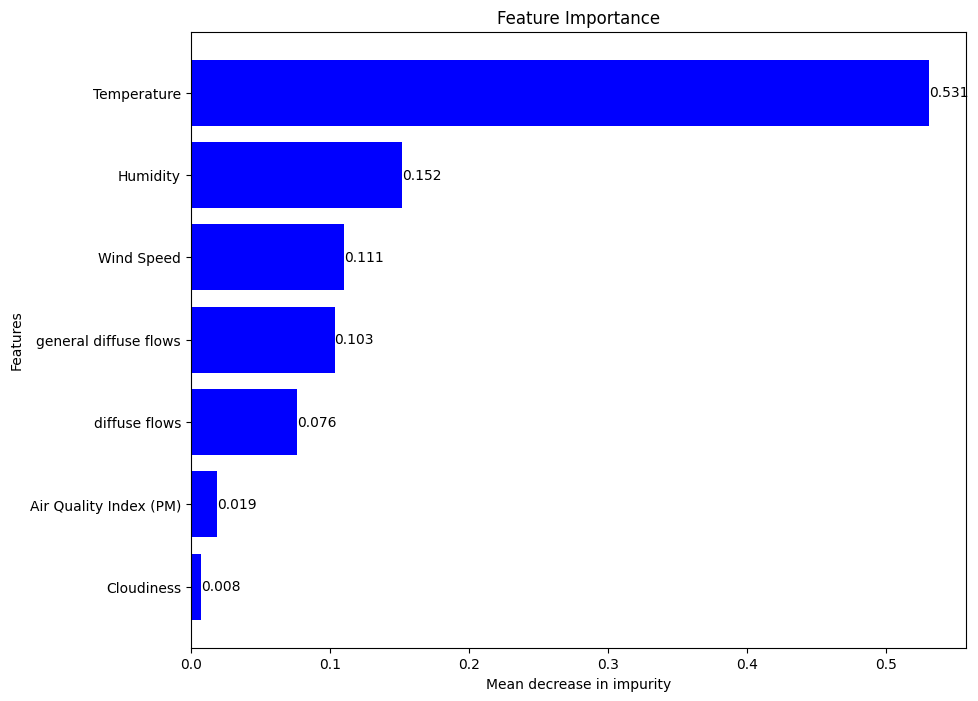

In [100]:
fig,ax=plt.subplots(figsize=(10,8))
bars=ax.barh(feature_importance['Feature'],feature_importance['Importance'], color = 'blue')
ax.invert_yaxis()
ax.bar_label(bars, fmt="%.3f")
plt.xlabel('Mean decrease in impurity')
plt.ylabel('Features')
plt.title('Feature Importance')


#### Temperature,Humidity,general diffuse flows,wind speed are the most important features.